In [1]:
import tensorflow as tf
import numpy as np
import os
import matplotlib.pyplot as plt
import librosa
from keras.layers import (Input, Add, Dense, Activation, ZeroPadding2D, BatchNormalization, Flatten, 
                          Conv2D, AveragePooling2D, MaxPooling2D, GlobalMaxPooling2D)
from keras.models import Model, load_model
from keras.preprocessing import image
from keras.utils import layer_utils, load_img, img_to_array
from IPython.display import SVG, Audio
from keras.layers import Dropout, GlobalAveragePooling2D
from keras.utils.vis_utils import model_to_dot
from keras.utils import plot_model
from keras.optimizers import Adam
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas
from pydub import AudioSegment
import shutil
import keras.backend as K
from keras.preprocessing.image import ImageDataGenerator
import random
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
#####################################
import sys
sys.path.insert(0, 'HelperFiles')
from HelperFunctions import *
#####################################

gpu_devices = tf.config.experimental.list_physical_devices('GPU')
for device in gpu_devices:
    tf.config.experimental.set_memory_growth(device, True)

2023-05-07 10:33:10.979316: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
/home/chrispv/miniconda3/envs/tf-LSTM/lib/python3.8/site-packages/pydub/utils.py:170: RuntimeWarning: Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work
  warn("Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work", RuntimeWarning)
2023-05-07 10:33:13.361311: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:967] could not open file to read NUMA node: /sys/bus/pci/devices/0000:0c:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-05-07 10:33:13.385278: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:967] could not open file to read NUMA node: /sys/bus

In [2]:
datasetPath = "../../datasets"

In [3]:
genres = 'blues classical country disco hiphop jazz metal pop reggae rock'
genres = genres.split()

In [4]:
test_dir = f"{datasetPath}/spectrograms3sec/test/"
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(test_dir,target_size=(128,130),color_mode='rgba',class_mode='categorical',batch_size=32)

Found 1000 images belonging to 10 classes.


In [5]:

def GenreModel(input_shape = (128,130, 4),classes=10):
  X_input = Input(input_shape)

  X = Conv2D(256, kernel_size=(3,3), activation='relu',padding="valid")(X_input)

  X = Conv2D(256, kernel_size=(3,3), activation='relu',padding="valid")(X)
  X = AveragePooling2D(pool_size=(3, 3), strides=(2,2),padding="same")(X)
  
  X = Conv2D(256, kernel_size=(3,3), activation='relu',padding="valid")(X)
  X = AveragePooling2D(pool_size=(3, 3), strides=(2,2),padding="same")(X)

  X = Conv2D(512, kernel_size=(4,4), activation='relu',padding="valid")(X)
  X = GlobalAveragePooling2D()(X)

  X = Dense(256, activation='relu')(X)
  X = Dense(128, activation='relu')(X)
  X = Dense(10, activation='softmax')(X)

  model = Model(inputs=X_input,outputs=X,name='GenreModel')

  return model

In [6]:
# checkpoint_path = "saved_cnn3/cp.ckpt"
# checkpoint_dir = os.path.dirname(checkpoint_path)

# # Create a callback that saves the model's weights
# cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
#                                                 save_weights_only=False,
#                                                 verbose=1)

model = GenreModel(input_shape=(128,431, 4), classes=10)
opt = Adam()
model.compile(optimizer = opt,loss='categorical_crossentropy',metrics=['accuracy'])

2023-05-07 10:33:13.720330: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-05-07 10:33:13.722339: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:967] could not open file to read NUMA node: /sys/bus/pci/devices/0000:0c:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-05-07 10:33:13.722682: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:967] could not open file to read NUMA node: /sys/bus/pci/devices/0000:0c:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-05-07 10:33:13.723036: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:967] could not open file to read NUMA node: /sys/bus/pci/devices/0000:0c:00.0/numa_nod

In [7]:
model.summary()

Model: "GenreModel"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 128, 431, 4)]     0         
                                                                 
 conv2d (Conv2D)             (None, 126, 429, 256)     9472      
                                                                 
 conv2d_1 (Conv2D)           (None, 124, 427, 256)     590080    
                                                                 
 average_pooling2d (AverageP  (None, 62, 214, 256)     0         
 ooling2D)                                                       
                                                                 
 conv2d_2 (Conv2D)           (None, 60, 212, 256)      590080    
                                                                 
 average_pooling2d_1 (Averag  (None, 30, 106, 256)     0         
 ePooling2D)                                            

In [8]:
model = keras.models.load_model("saved/saved_cnn18_3_BEST.hdf5")

In [9]:
test_loss, test_acc = model.evaluate(test_generator, batch_size=128)
print("The test Loss is :", test_loss)
print("\nThe Best test Accuracy is :", test_acc*100)

2023-05-07 10:33:15.852601: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:428] Loaded cuDNN version 8100


 3/32 [=>............................] - ETA: 1s - loss: 0.6044 - accuracy: 0.7812  

2023-05-07 10:33:18.503409: I tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:630] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


32/32 [==============================] - 7s 124ms/step - loss: 0.4783 - accuracy: 0.8260
The test Loss is : 0.4782876968383789

The Best test Accuracy is : 82.59999752044678


In [10]:
class estimator:
  _estimator_type = ''
  classes_=[]
  def __init__(self, model, classes):
    self.model = model
    self._estimator_type = 'classifier'
    self.classes_ = classes
  def predict(self, X):
    y_prob= self.model.predict(X)
    y_pred = y_prob.argmax(axis=1)
    return y_pred

classifier = estimator(model, genres)
figsize = (12,12)

x, y = zip(*(test_generator[i] for i in range(len(test_generator))))
x_test, y_test = np.vstack(x), np.vstack(y)
y_test = np.argmax(y_test, axis=1)

32/32 [==============================] - 1s 32ms/step


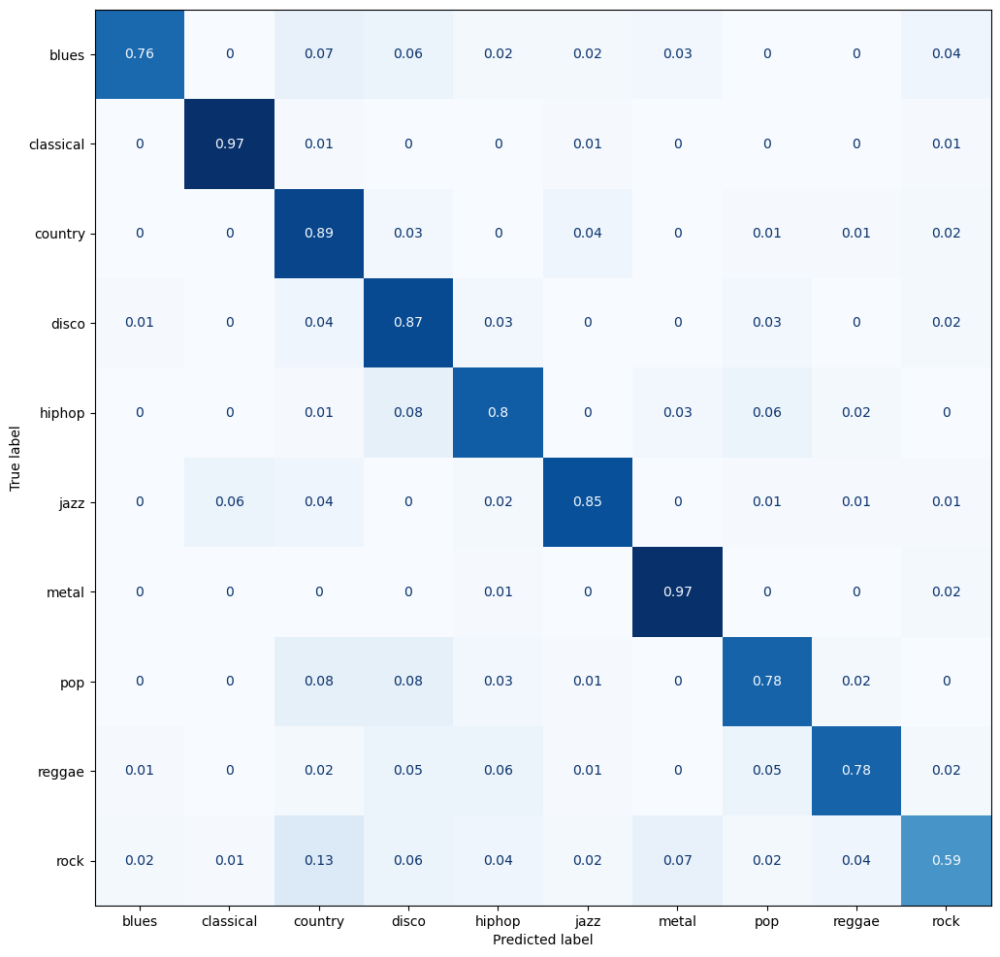

In [11]:
ConfusionMatrixDisplay.from_estimator(classifier, x_test, y_test, cmap='Blues', display_labels=genres ,normalize='true',colorbar=False, ax=plt.subplots(figsize=figsize)[1])

In [12]:
import pathlib
input_dir = pathlib.Path("../../src/input/")
audio_file_name = "chopin.wav"
sample_dir = "../../src/input/samples/"
audio_seg_dir = "../../src/input/audio_segments/"
image_dir = "../../src/input/image_segments/"

if not input_dir.exists():
    os.mkdir("../../src/input")
    os.mkdir(sample_dir)
    os.mkdir(audio_seg_dir)
        
sample, sample_sr = librosa.load(os.path.join(sample_dir, audio_file_name))
sample_duration = int(librosa.get_duration(y=sample, sr=sample_sr))
Audio(sample, rate=sample_sr)

In [13]:
chopAudio(os.path.join(sample_dir, audio_file_name), audio_seg_dir)

In [14]:
audiosToGraph(audio_seg_dir, image_dir,type="ms")

In [15]:
predictions = []

for af in os.listdir(image_dir):
    image_data = load_img(os.path.join(image_dir, af[:-3] + 'png'),color_mode='rgba',target_size=(128,130))
    image = img_to_array(image_data)
    image = np.reshape(image,(1,128,130,4))

    p = model.predict(image/255)
    p = p.reshape((10,))

    predictions.append(p)

1/1 [==============================] - 0s 21ms/step


In [16]:
avg_preds = [x / len(predictions) for x in np.array(predictions).sum(axis=0)]
predicted_label = np.argmax(avg_preds)

print("The Predicted Label was: " + genres[predicted_label])

The Predicted Label was: classical


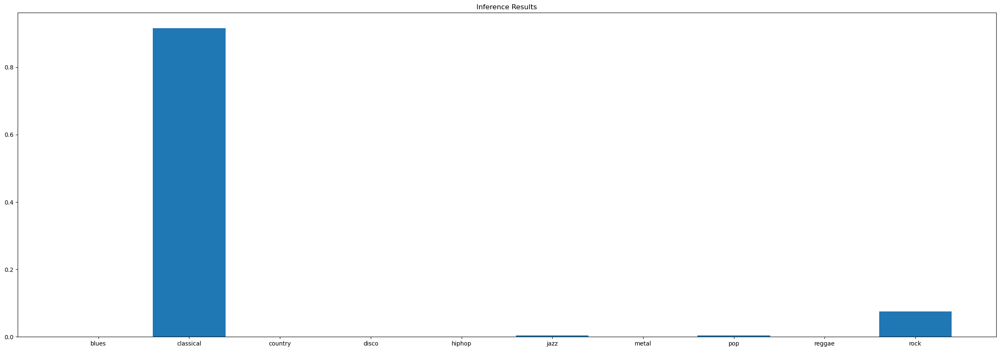

In [17]:
plt.figure(figsize=(30,10))
plt.bar(genres, np.array(avg_preds))
plt.title("Inference Results")
plt.show()